In [1]:
pip uninstall numpy

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Would remove:
    /usr/local/bin/f2py
    /usr/local/bin/numpy-config
    /usr/local/lib/python3.11/dist-packages/numpy-2.0.2.dist-info/*
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libgfortran-040039e1-0352e75f.so.5.0.0
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libquadmath-96973f99-934c22de.so.0.0.0
    /usr/local/lib/python3.11/dist-packages/numpy.libs/libscipy_openblas64_-99b71e71.so
    /usr/local/lib/python3.11/dist-packages/numpy/*
Proceed (Y/n)? y
  Successfully uninstalled numpy-2.0.2


In [2]:
pip install numpy==1.25.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 52.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.25.1 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.25.1 which is incompatible.
blosc2 3.2.0 requires numpy>=1.26, but you have numpy 1.25.1 which is incompatible.


In [102]:
import os
from os import listdir
from os.path import isfile, join
import csv

import pandas as pd
import tensorflow as tf

from google.colab import drive

In [103]:
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [104]:
import cv2
import dlib
import numpy as np

In [105]:
# upload retrained_graph.pb, retrained_labels.txt
# upload age_deploy and age_net openCV model inputs
# upload folder data with images
# Import the necessary module for displaying images in Colab
from google.colab.patches import cv2_imshow

In [106]:
# folder containing the images
image_folder = 'data'
image_csv = 'images.csv'

In [107]:
# collect file paths and names
image_data = []
for root, _, files in os.walk(image_folder):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
            file_path = os.path.join(root, file)
            image_data.append([file_path, file])

In [108]:
# Debugging: Check if any images were found
if not image_data:
    print(f"No image files found in the folder: {image_folder}")
else:
    print(f"Found {len(image_data)} image files.")

Found 15 image files.


In [109]:
try:
    # Write to CSV
    with open(image_csv, mode='w', newline='', encoding='utf-8') as csv_file:
        writer = csv.writer(csv_file)
        writer.writerow(['image_path', 'image_name'])  # Header
        writer.writerows(image_data)
    print(f"CSV file created at: {image_csv}")
except Exception as e:
    print(f"Error writing to CSV: {e}")

CSV file created at: images.csv


In [110]:
# Load image paths from CSV
df = pd.read_csv("images.csv")

In [111]:
df.head()

,image_path,image_name
0,data/1 (25).jpeg,1 (25).jpeg
1,data/1 (5).jpg,1 (5).jpg
2,data/man1.jpg,man1.jpg
3,data/woman1.jpg,woman1.jpg
4,data/minion.jpg,minion.jpg


In [112]:
# Make sure the csv has a column 'image_path'
image_paths = df["image_path"].tolist()

In [113]:
# Load label names (male, female)
label_lines = [line.rstrip() for line in tf.io.gfile.GFile("retrained_labels.txt")]

In [114]:
# Load trained model
with tf.io.gfile.GFile("retrained_graph.pb", 'rb') as f:
    graph_def = tf.compat.v1.GraphDef()
    graph_def.ParseFromString(f.read())
    _ = tf.import_graph_def(graph_def, name='')

In [115]:
# ------------ Model for Age detection --------#
age_weights = "age_deploy.prototxt"
age_config = "age_net.caffemodel"

In [116]:
# Model requirements for image
ageList = ['(0-2)', '(4-6)', '(8-12)', '(15-20)',
        '(25-32)', '(38-43)', '(48-53)', '(60-100)']
model_mean = (78.4263377603, 87.7689143744, 114.895847746)

In [117]:
# ------------- Model for face detection---------#
face_detector = dlib.get_frontal_face_detector()

In [118]:
# Make predictions
predictions_list = []

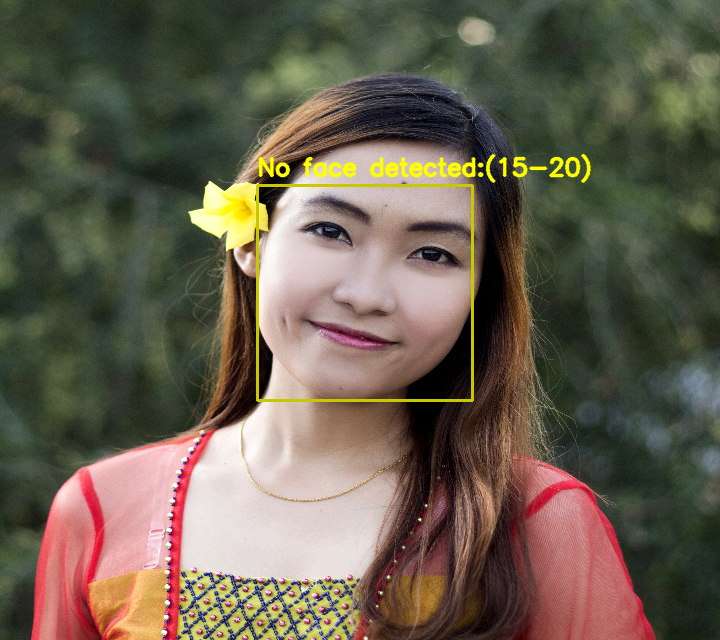

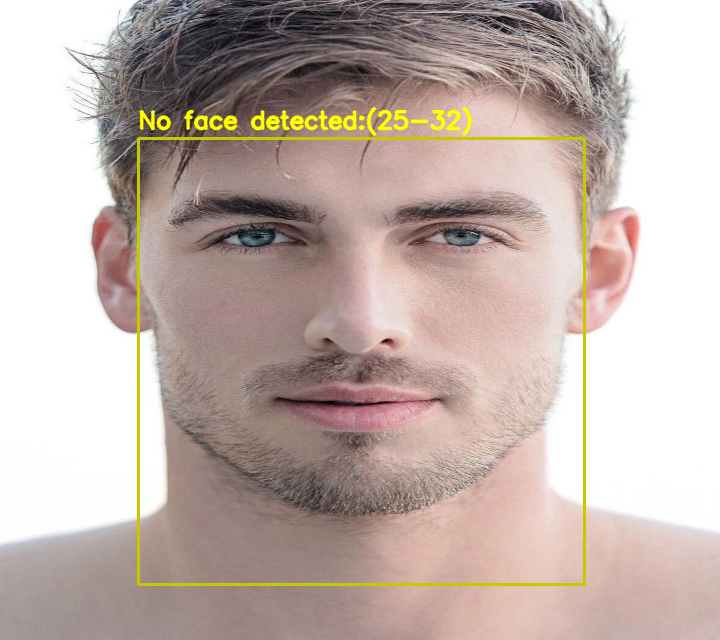

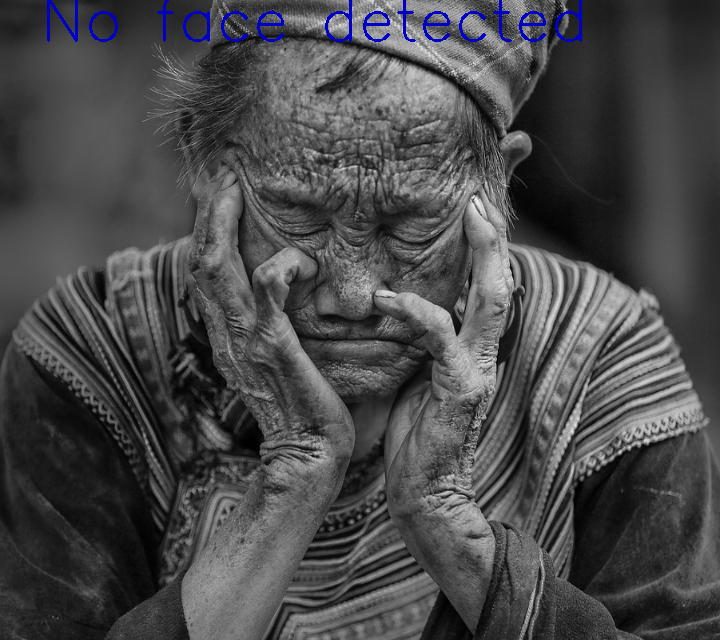

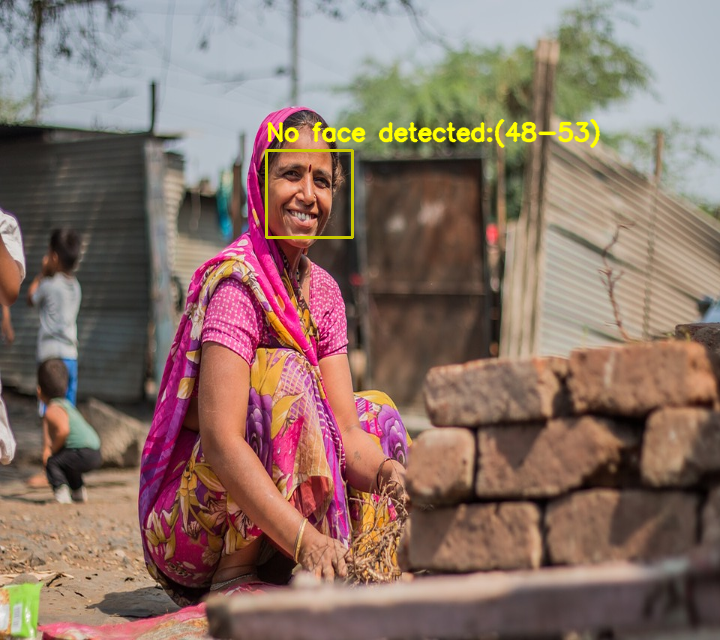

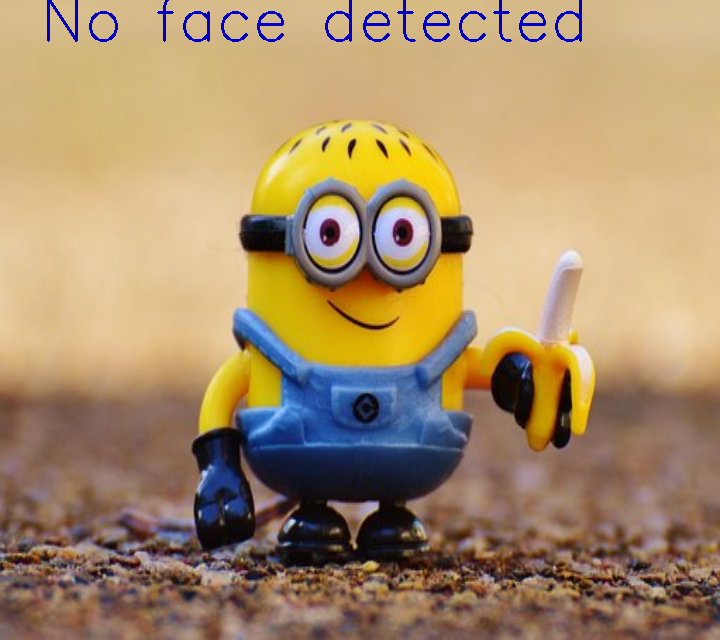

...

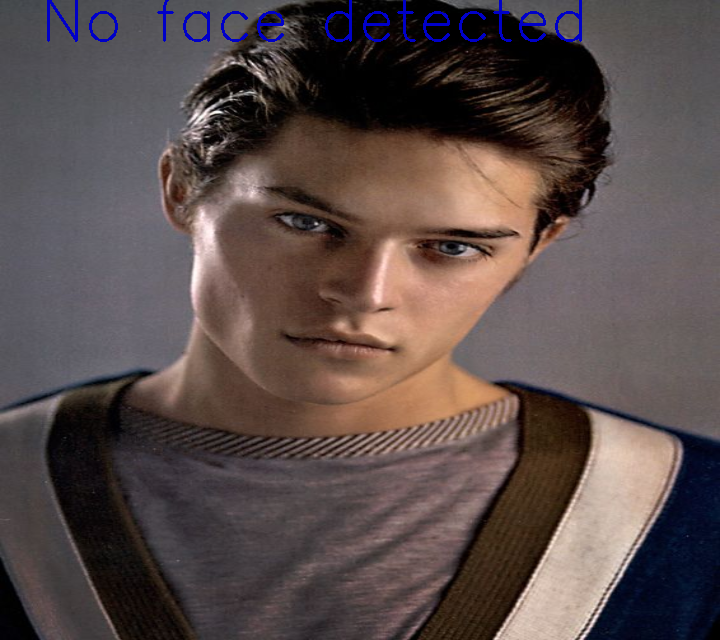

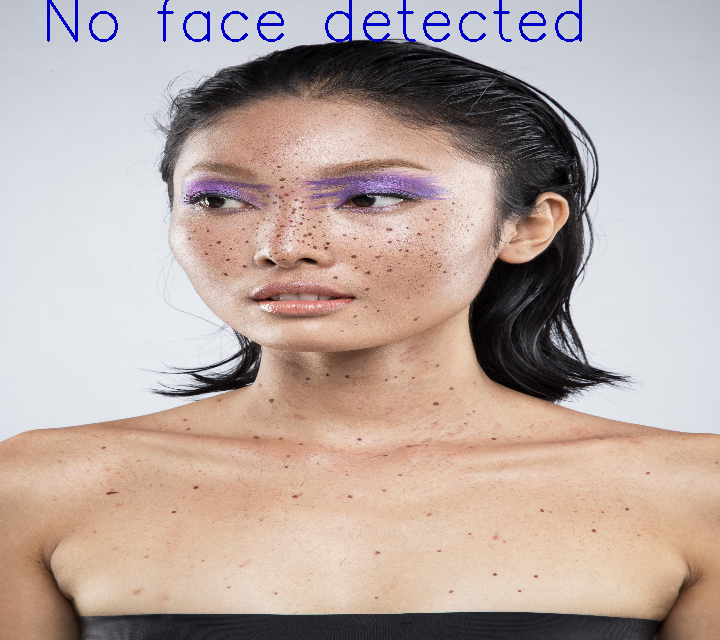

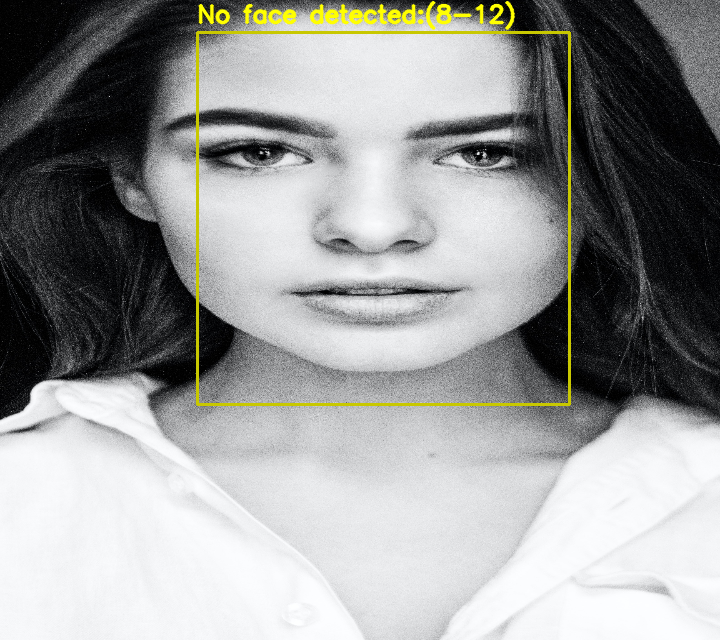

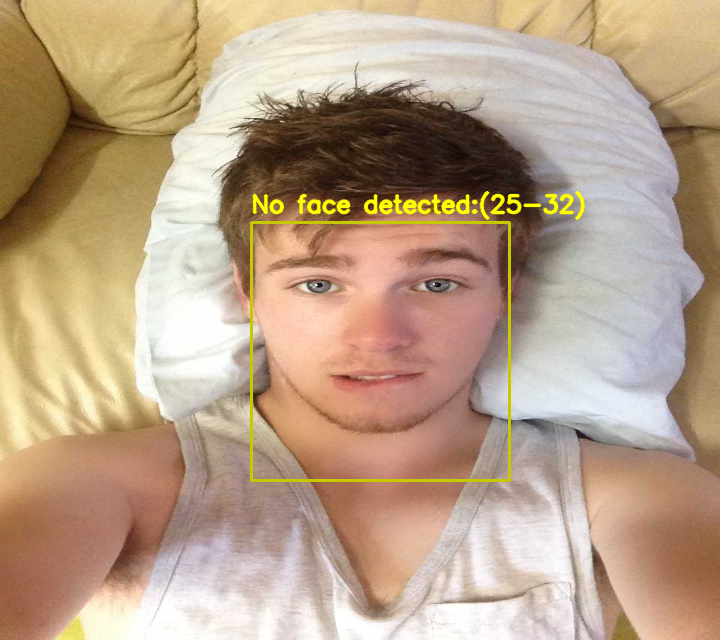

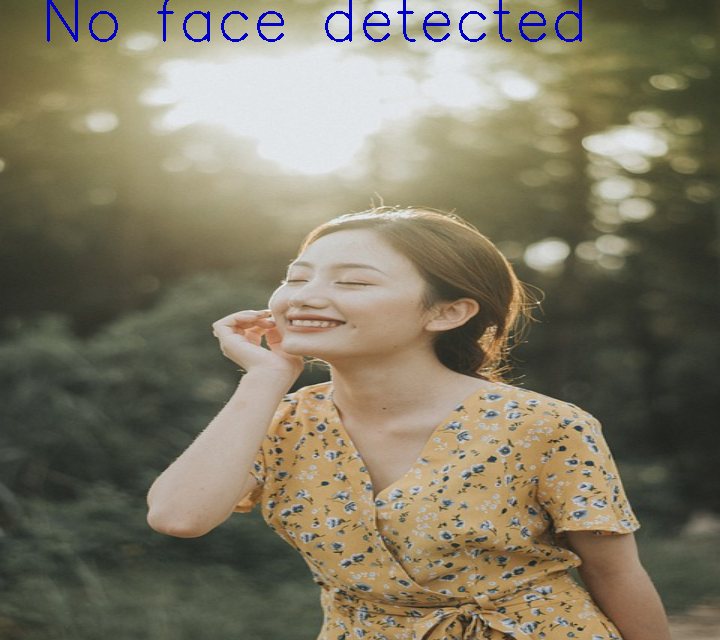

In [119]:
with tf.compat.v1.Session() as sess:
    softmax_tensor = sess.graph.get_tensor_by_name('final_result:0')

    mssg = "age"

    for image_path in image_paths:
        image_data = tf.io.gfile.GFile(image_path, 'rb').read()
        predictions = sess.run(softmax_tensor, {'DecodeJpeg/contents:0': image_data})

        # START OF AGE DETECTION CODE

        img = cv2.imread(image_path)
        img = cv2.resize(img, (720, 640))
        img.astype('uint8')
        age_Net = cv2.dnn.readNet(age_config, age_weights)

        frame = img.copy()

        # storing the image dimensions
        fH = img.shape[0]
        fW = img.shape[1]

        Boxes = [] # to store the face co-ordinates
        # mssg = 'Face Detected' # to display on image

        # converting to grayscale
        img_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # -------------detecting the faces--------------#
        faces = face_detector(img_gray)

        # If no faces are detected
        if not faces:
            mssg = 'No face detected'
            cv2.putText(img, f'{mssg}', (40, 40),cv2.FONT_HERSHEY_SIMPLEX, 2, (200), 2)
            # Use cv2_imshow instead of cv2.imshow
            cv2_imshow(img)
            cv2.waitKey(0)

        else:
            # --------- Bounding Face ---------#
            for face in faces:
                x = face.left() # extracting the face coordinates
                y = face.top()
                x2 = face.right()
                y2 = face.bottom()

                # rescaling those coordinates for our image
                box = [x, y, x2, y2]
                Boxes.append(box)
                cv2.rectangle(frame, (x, y), (x2, y2),(00, 200, 200), 2)

            for box in Boxes:

                # TEST!!!
                # print(mssg)

                face = frame[box[1]:box[3], box[0]:box[2]]

                # ----- Image preprocessing --------#
                blob = cv2.dnn.blobFromImage(face, 1.0, (227, 227), model_mean, swapRB=False)

                # -------Age Prediction---------#
                age_Net.setInput(blob)
                age_preds = age_Net.forward()
                age = ageList[age_preds[0].argmax()]

                cv2.putText(frame, f'{mssg}:{age}', (box[0],box[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 0.8,(0, 255, 255), 2, cv2.LINE_AA)
                # Use cv2_imshow instead of cv2.imshow
                cv2_imshow(frame)
                cv2.waitKey(0)

                # TEST!!!
                # print(age)

          # This code is modified by Susobhan Akhuli


        # END OF AGE DETECTION CODE


        # Get the most confident prediction
        top_label_index = predictions[0].argsort()[-1]
        predicted_label = label_lines[top_label_index]

        # Store results
        predictions_list.append({"image_path": image_path, "gender": predicted_label, "age": age})

In [120]:
predictions_list[:5]

[{'image_path': 'data/1 (25).jpeg',
  'gender': 'female',
  'age': '(15-20)',
  'mssg': 'No face detected'},
 {'image_path': 'data/1 (5).jpg',
  'gender': 'male',
  'age': '(25-32)',
  'mssg': 'No face detected'},
 {'image_path': 'data/man1.jpg',
  'gender': 'male',
  'age': '(25-32)',
  'mssg': 'No face detected'},
 {'image_path': 'data/woman1.jpg',
  'gender': 'female',
  'age': '(48-53)',
  'mssg': 'No face detected'},
 {'image_path': 'data/minion.jpg',
  'gender': 'male',
  'age': '(48-53)',
  'mssg': 'No face detected'}]

In [121]:
# Save predictions to CSV
results_df = pd.DataFrame(predictions_list)
results_df.to_csv("classified_images.csv", index=False)

In [122]:
results_df.head()

,image_path,gender,age,mssg
0,data/1 (25).jpeg,female,(15-20),No face detected
1,data/1 (5).jpg,male,(25-32),No face detected
2,data/man1.jpg,male,(25-32),No face detected
3,data/woman1.jpg,female,(48-53),No face detected
4,data/minion.jpg,male,(48-53),No face detected


In [123]:
print("Classification complete! Results saved in 'classified_images.csv'.")

Classification complete! Results saved in 'classified_images.csv'.


In [124]:
results_df.to_csv("/content/drive/My Drive/classified_images.csv", index=False)

In [125]:
df_verify = pd.read_csv("/content/drive/My Drive/classified_images.csv")

In [126]:
df_verify.head()

,image_path,gender,age,mssg
0,data/1 (25).jpeg,female,(15-20),No face detected
1,data/1 (5).jpg,male,(25-32),No face detected
2,data/man1.jpg,male,(25-32),No face detected
3,data/woman1.jpg,female,(48-53),No face detected
4,data/minion.jpg,male,(48-53),No face detected
